# Definiciones

- **Depth**: Depth refers to the vertical position or distance below the surface at which a particular measurement or observation is taken. It provides the spatial information along the wellbore or stratigraphic column.

- **Caliper**: Caliper is a measurement of the diameter or width of a borehole or wellbore. It helps assess the size and shape of the wellbore, which is important for understanding drilling operations, casing placement, and well integrity.

- **Density Correction**: Density correction is the adjustment made to measurements, such as resistivity or porosity, to account for the density of the drilling fluid or mud in the wellbore. It ensures that the recorded values accurately reflect the properties of the surrounding rock formations.

- **Delta-T**: Delta-T, also known as travel time or transit time, refers to the time it takes for a wave or signal to travel a known distance in the subsurface. In stratigraphy, delta-T is often measured using sonic or acoustic tools and can be used to estimate porosity and rock properties.

- **Gamma Ray**: Gamma ray measures the natural gamma radiation emitted by the rocks. It provides information about the lithology, identifying different formations and lithological changes within the wellbore. Gamma ray logs are commonly used for correlation and identification of specific rock units.

- **Deep Induction Standard Processed Resistivity**: Deep induction standard processed resistivity is a measurement of electrical resistivity in the subsurface. It helps determine the conductivity or resistivity of the formation and provides insights into lithology, fluid content, and rock properties.

- **Medium Induction Standard Processed Resistivity**: Medium induction standard processed resistivity is another measurement of electrical resistivity in the subsurface. It provides additional information on the conductivity or resistivity of the formation, which aids in lithology and fluid analysis.

- **Neutron Porosity**: Neutron porosity is a measurement of the hydrogen content or porosity of the rock formation. Neutrons are scattered by hydrogen atoms, and by analyzing the response of neutrons, neutron porosity logs estimate the porosity and fluid content in the subsurface.

- **Bulk Density**: Bulk density refers to the density of the rock formation. It is often measured using density logs or derived from other measurements such as neutron porosity and resistivity. Bulk density is essential for estimating rock properties, porosity, and fluid content.

- **Photo-Electric Factor**: Photo-electric factor (PEF) is a measurement of the electron density of the rock formation. It is obtained by measuring the absorption of gamma rays with different energies. PEF is useful in identifying lithology and assessing the presence of clay minerals.

- **SFL Resistivity**: SFL resistivity, also known as shallow focused log resistivity, is a measurement of resistivity near the wellbore. It provides information about the formation resistivity, fluid content, and rock properties near the borehole.

- **Spontaneous Potential**: Spontaneous potential (SP) is a measurement of natural electrical potential between the wellbore and the surrounding formation. SP logs are used to identify permeable zones, determine formation boundaries, and detect fluid movement within the rock.

In [1]:
from prophet.plot import add_changepoints_to_plot
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from statsmodels.tsa.seasonal import seasonal_decompose 
import lasio
from datetime import datetime, timedelta, date
from sklearn.decomposition import PCA
from prophet import Prophet
from sklearn.preprocessing import StandardScaler
from prophet.plot import plot_plotly, plot_components_plotly
from statsmodels.tsa.statespace.sarimax import SARIMAX
from statsmodels.tsa.arima.model import ARIMA
from pmdarima import auto_arima                        

## Apertura archivos Lasio

In [2]:
las = lasio.read("../data/LJ-1005.LAS")
well = las.df()
df = well.reset_index()

In [3]:
well.head()

,CALI,DRHO,DT,GR,ILD,ILM,NPHI,PEF,RHOB,SFLA,SP
DEPT,,,,,,,,,,,
2199.9961,6.0,0.058,50.0,0.0,2.47,2.91,18.678,2.925,2.492,2.16,-0.97
2199.8438,6.0,0.059,50.0,0.0,2.47,2.91,18.843,2.886,2.491,2.16,-0.99
2199.6914,6.0,0.059,50.0,0.0,2.47,2.91,19.092,2.824,2.490,2.16,-0.92
2199.5391,6.0,0.059,50.0,0.0,2.47,2.91,19.127,2.808,2.490,2.16,-0.85
2199.3867,6.0,0.063,50.0,0.0,2.47,2.91,19.030,2.781,2.494,2.16,-0.75


# Analisis de Variables

In [4]:
well_nan = well.notnull() * 1

In [5]:
well.describe()

,CALI,DRHO,DT,GR,ILD,ILM,NPHI,PEF,RHOB,SFLA,SP
count,11812.000000,2777.000000,11812.000000,11812.000000,11812.000000,11812.000000,2777.000000,2777.000000,2777.000000,11812.000000,11812.000000
mean,8.735646,0.060866,91.408673,78.010168,2.799011,2.876940,15.044799,3.292078,2.548709,9.550108,-29.547874
std,0.615551,0.052810,15.631570,29.209228,3.127897,3.503565,6.698188,0.636934,0.118234,156.459894,21.044805
min,6.000000,-0.500000,50.000000,0.000000,0.320000,0.100000,-15.000000,0.000000,2.000000,0.100000,-85.700000
25%,8.360000,0.041000,80.337500,60.600000,1.370000,1.380000,12.178000,2.860000,2.476000,1.650000,-40.435000
50%,8.580000,0.062000,94.705000,74.495000,1.880000,1.900000,16.243000,3.085000,2.532000,2.240000,-22.070000
75%,8.970000,0.083000,101.550000,95.635000,3.150000,3.220000,18.948000,3.544000,2.618000,3.970000,-16.440000
max,13.880000,0.204000,146.710000,527.720000,37.880000,53.370000,31.668000,6.055000,2.958000,5000.000000,40.940000


/tmp/ipykernel_23600/4289529950.py:3: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  ax1 = plt.subplot2grid((1,11), (0,0), rowspan=1, colspan = 1)


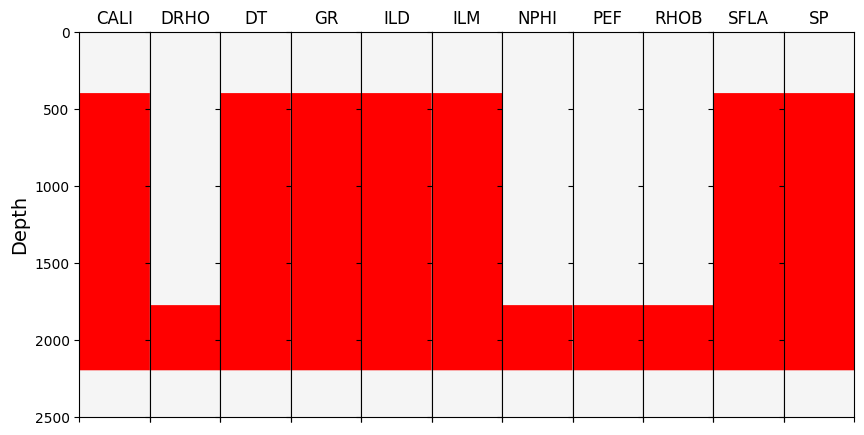

In [6]:
fig = plt.subplots(figsize=(10,5))

ax1 = plt.subplot2grid((1,11), (0,0), rowspan=1, colspan = 1) 
ax2 = plt.subplot2grid((1,11), (0,1), rowspan=1, colspan = 1)
ax3 = plt.subplot2grid((1,11), (0,2), rowspan=1, colspan = 1)
ax4 = plt.subplot2grid((1,11), (0,3), rowspan=1, colspan = 1)
ax5 = plt.subplot2grid((1,11), (0,4), rowspan=1, colspan = 1)
ax6 = plt.subplot2grid((1,11), (0,5), rowspan=1, colspan = 1)
ax7 = plt.subplot2grid((1,11), (0,6), rowspan=1, colspan = 1)
ax8 = plt.subplot2grid((1,11), (0,7), rowspan=1, colspan = 1)
ax9 = plt.subplot2grid((1,11), (0,8), rowspan=1, colspan = 1)
ax10 = plt.subplot2grid((1,11), (0,9), rowspan=1, colspan = 1)
ax11 = plt.subplot2grid((1,11), (0,10), rowspan=1, colspan = 1)

columns = well_nan.columns
axes = [ax1, ax2, ax3, ax4, ax5, ax6, ax7, ax8, ax9, ax10, ax11]

for i, ax in enumerate(axes):
    ax.plot(well_nan.iloc[:,i], well_nan.index, lw=0)
    ax.set_ylim(2500, 0)
    ax.set_xlim(0, 1)
    ax.set_title(columns[i])
    ax.set_facecolor('whitesmoke')
    ax.fill_betweenx(well_nan.index, 0, well_nan.iloc[:,i], facecolor='red')
    
    if i > 0:
        plt.setp(ax.get_yticklabels(), visible = False)
    plt.setp(ax.get_xticklabels(), visible = False)
    ax1.set_ylabel('Depth', fontsize=14)

plt.subplots_adjust(wspace=0)
plt.show()

/tmp/ipykernel_23600/3530254647.py:3: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  ax1 = plt.subplot2grid((1,6), (0,0), rowspan=1, colspan = 1)


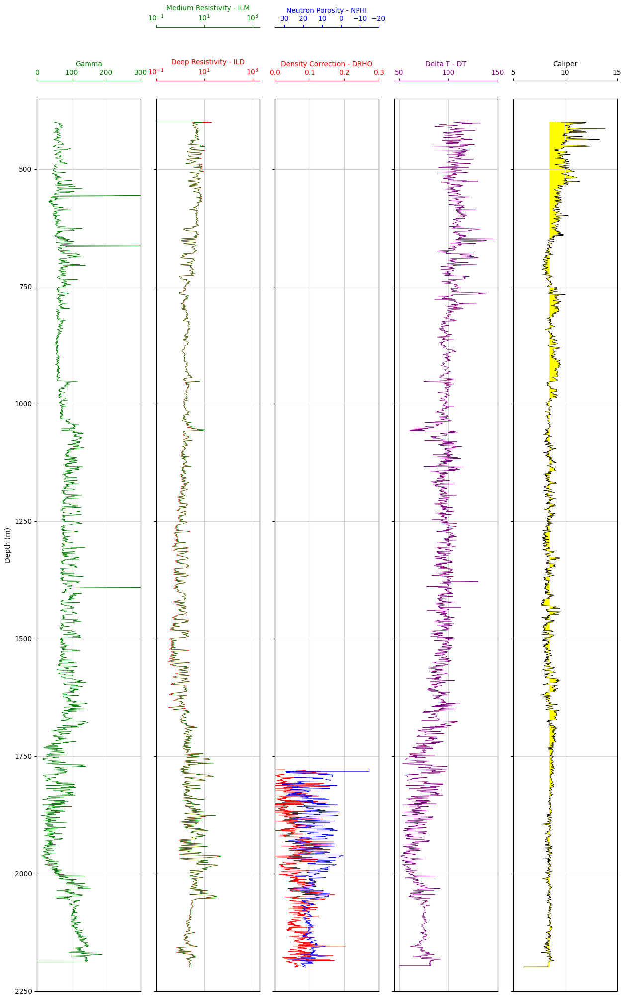

In [7]:
fig, ax = plt.subplots(figsize=(15,20))

ax1 = plt.subplot2grid((1,6), (0,0), rowspan=1, colspan = 1)
ax2 = plt.subplot2grid((1,6), (0,1), rowspan=1, colspan = 1, sharey = ax1)
ax3 = plt.subplot2grid((1,6), (0,2), rowspan=1, colspan = 1, sharey = ax1)
ax4 = plt.subplot2grid((1,6), (0,3), rowspan=1, colspan = 1, sharey = ax1)
ax5 = ax3.twiny() 
ax6 = plt.subplot2grid((1,6), (0,4), rowspan=1, colspan = 1, sharey = ax1)
ax7 = ax2.twiny()

ax10 = ax1.twiny()
ax10.xaxis.set_visible(False)
ax11 = ax2.twiny()
ax11.xaxis.set_visible(False)
ax12 = ax3.twiny()
ax12.xaxis.set_visible(False)
ax13 = ax4.twiny()
ax13.xaxis.set_visible(False)
ax14 = ax6.twiny()
ax14.xaxis.set_visible(False)

# Gamma Ray track
ax1.plot(well["GR"], well.index, color = "green", linewidth = 0.5)
ax1.set_xlabel("Gamma")
ax1.xaxis.label.set_color("green")
ax1.set_xlim(0, 300)
ax1.set_ylabel("Depth (m)")
ax1.tick_params(axis='x', colors="green")
ax1.spines["top"].set_edgecolor("green")
ax1.title.set_color('green')
ax1.set_xticks([0, 100, 200, 300])

# Deep Resistivity - ILD
ax2.plot(well["ILD"], well.index, color = "red", linewidth = 0.5)
ax2.set_xlabel("Deep Resistivity - ILD")
ax2.set_xlim(0.2, 2000)
ax2.xaxis.label.set_color("red")
ax2.tick_params(axis='x', colors="red")
ax2.spines["top"].set_edgecolor("red")
ax2.set_xticks([0.1, 1, 10, 100, 1000])
ax2.semilogx()

# Medium Resistivity - ILM
ax7.plot(well["ILM"], well.index, color = "green", linewidth = 0.5)
ax7.set_xlabel("Medium Resistivity - ILM")
ax7.set_xlim(0.2, 2000)
ax7.xaxis.label.set_color("green")
ax7.spines["top"].set_position(("axes", 1.08))
ax7.spines["top"].set_visible(True)
ax7.tick_params(axis='x', colors="green")
ax7.spines["top"].set_edgecolor("green")
ax7.set_xticks([0.1, 1, 10, 100, 1000])
ax7.semilogx()

# Density Correction - DRHO
ax3.plot(well["DRHO"], well.index, color = "red", linewidth = 0.5)
ax3.set_xlabel("Density Correction - DRHO")
ax3.set_xlim(0.0, 0.3)
ax3.xaxis.label.set_color("red")
ax3.tick_params(axis='x', colors="red")
ax3.spines["top"].set_edgecolor("red")
ax3.set_xticks([0.0, 0.1, 0.2, 0.3])

# Neutron Porosity - NPHI
ax5.plot(well["NPHI"], well.index, color = "blue", linewidth = 0.5)
ax5.set_xlabel('Neutron Porosity - NPHI')
ax5.xaxis.label.set_color("blue")
ax5.set_xlim(35, -20)
#ax5.set_ylim(4150, 3500)
ax5.tick_params(axis='x', colors="blue")
ax5.spines["top"].set_position(("axes", 1.08))
ax5.spines["top"].set_visible(True)
ax5.spines["top"].set_edgecolor("blue")
ax5.set_xticks([30, 20, 10, 0, -10, -20])

# Delta T - DT
ax4.plot(well["DT"], well.index, color = "purple", linewidth = 0.5)
ax4.set_xlabel("Delta T - DT")
ax4.set_xlim(45, 150)
ax4.xaxis.label.set_color("purple")
ax4.tick_params(axis='x', colors="purple")
ax4.spines["top"].set_edgecolor("purple")

# Caliper track
ax6.plot(well["CALI"], well.index, color = "black", linewidth = 0.5)
ax6.set_xlabel("Caliper")
ax6.set_xlim(5, 15)
ax6.xaxis.label.set_color("black")
ax6.tick_params(axis='x', colors="black")
ax6.spines["top"].set_edgecolor("black")
ax6.fill_betweenx(well_nan.index, 8.5, well["CALI"], facecolor='yellow')
ax6.set_xticks([5, 10, 15])

for ax in [ax1, ax2, ax3, ax4, ax6]:
    ax.set_ylim(2250, 350 )
    ax.grid(which='major', color='lightgrey', linestyle='-')
    ax.xaxis.set_ticks_position("top")
    ax.xaxis.set_label_position("top")
    ax.spines["top"].set_position(("axes", 1.02))

for ax in [ax2, ax3, ax4, ax6]:
    plt.setp(ax.get_yticklabels(), visible = False)

plt.tight_layout()
fig.subplots_adjust(wspace = 0.15)
plt.show()

### Correlation

In [8]:
corr = well.corr()
corr.style.background_gradient(cmap='coolwarm')

,CALI,DRHO,DT,GR,ILD,ILM,NPHI,PEF,RHOB,SFLA,SP
CALI,1.000000,-0.176217,0.326161,-0.170501,0.219894,0.168905,-0.091167,0.180896,0.166141,-0.012692,0.602934
DRHO,-0.176217,1.000000,0.037881,0.222596,-0.099130,-0.094787,0.411932,-0.186073,0.055884,-0.043061,-0.117947
DT,0.326161,0.037881,1.000000,0.108246,-0.297146,-0.322957,0.517950,-0.574158,-0.691679,-0.105550,0.112464
GR,-0.170501,0.222596,0.108246,1.000000,-0.279315,-0.270373,0.237850,-0.404199,-0.494933,-0.086972,-0.039308
ILD,0.219894,-0.099130,-0.297146,-0.279315,1.000000,0.979300,-0.495334,0.634045,0.495988,0.345644,0.311470
ILM,0.168905,-0.094787,-0.322957,-0.270373,0.979300,1.000000,-0.491447,0.622852,0.503424,0.441425,0.265765
NPHI,-0.091167,0.411932,0.517950,0.237850,-0.495334,-0.491447,1.000000,-0.539537,-0.416480,-0.183402,-0.055918
PEF,0.180896,-0.186073,-0.574158,-0.404199,0.634045,0.622852,-0.539537,1.000000,0.756148,0.246404,0.212947
RHOB,0.166141,0.055884,-0.691679,-0.494933,0.495988,0.503424,-0.416480,0.756148,1.000000,0.249952,0.254055
SFLA,-0.012692,-0.043061,-0.105550,-0.086972,0.345644,0.441425,-0.183402,0.246404,0.249952,1.000000,-0.000837


## Transformacion de variable profunidad en variable temporal para uso de serie de tiempo

In [9]:
df = df.sort_values("DEPT")
df["date"] = [date(2023, 4, 1) if x == 400.000 else datetime(2022,4,1,0,0,0) for x in df["DEPT"] ]
df["distance_diff"] = round(df["DEPT"].diff(), 3)
df['distance_diff'] = np.where(df['DEPT'] == 400,0, df["distance_diff"] )

last_date = df.iloc[0]["date"]
new_dates = []

for i, x in df.iterrows():
    #sec = x["distance_diff"]*10000
    if(x.distance_diff == 0.152):
        last_date += timedelta(days=1)
    else:
        last_date += timedelta(days=2)
    new_dates.append(last_date.strftime("%Y-%m-%d %X"))

df["dates_sec"] = new_dates
df.head()

,DEPT,CALI,DRHO,DT,GR,ILD,ILM,NPHI,PEF,RHOB,SFLA,SP,date,distance_diff,dates_sec
11811,400.0000,9.04,NaN,111.28,45.12,14.10,0.10,NaN,NaN,NaN,0.10,40.94,2023-04-01,0.000,2023-04-03 00:00:00
11810,400.1524,9.25,NaN,117.94,48.46,11.94,0.10,NaN,NaN,NaN,2.78,28.06,2022-04-01 00:00:00,0.152,2023-04-04 00:00:00
11809,400.3048,9.37,NaN,119.72,50.59,10.28,0.10,NaN,NaN,NaN,0.25,20.90,2022-04-01 00:00:00,0.152,2023-04-05 00:00:00
11808,400.4572,9.56,NaN,118.41,54.67,5.16,10.70,NaN,NaN,NaN,1.18,8.56,2022-04-01 00:00:00,0.152,2023-04-06 00:00:00
11807,400.6096,9.61,NaN,116.07,56.10,3.87,6.18,NaN,NaN,NaN,2.26,4.30,2022-04-01 00:00:00,0.152,2023-04-07 00:00:00


In [10]:
pd.set_option('display.max_rows', 100)

# Utilizacion de PCA para reduccion de dimensiones

In [11]:
print(df.columns)
pca = PCA(n_components=2)
X = df[['CALI', 'DRHO', 'DT', 'GR', 'ILD', 'ILM', 'NPHI', 'PEF', 'RHOB',
       'SFLA', 'SP']].fillna(0)
sc = StandardScaler()
X_std = sc.fit_transform(X)
pca.fit(X_std)
pca_features = pca.fit_transform(X_std)
pca_features

pca_df = pd.DataFrame(pca_features, columns=["x", "y"])
pca_df.head()

Index(['DEPT', 'CALI', 'DRHO', 'DT', 'GR', 'ILD', 'ILM', 'NPHI', 'PEF', 'RHOB',
       'SFLA', 'SP', 'date', 'distance_diff', 'dates_sec'],
      dtype='object')


,x,y
0,-0.575150,3.484853
1,-0.958351,3.072015
2,-1.163288,2.751979
3,-0.818383,3.269600
4,-1.199023,2.378924


# Components Importance

In [12]:
pd.DataFrame(pca.components_, columns = X.columns)

,CALI,DRHO,DT,GR,ILD,ILM,NPHI,PEF,RHOB,SFLA,SP
0,-0.100253,0.361884,-0.386381,-0.060393,0.243029,0.251201,0.396156,0.456924,0.455159,0.103203,0.018621
1,0.404285,-0.168766,0.096166,-0.255598,0.489663,0.481148,-0.213564,-0.045074,-0.098142,0.255503,0.373719


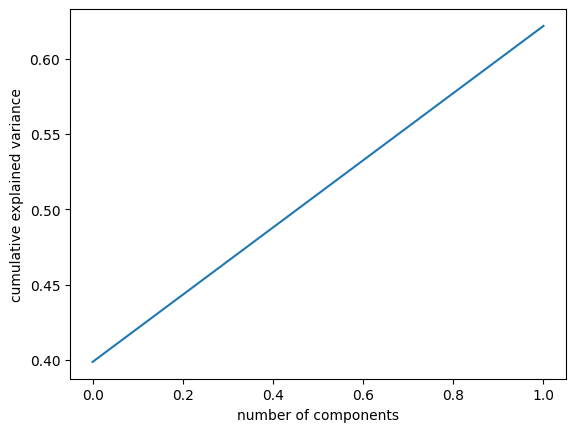

In [13]:
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.xlabel('number of components')
plt.ylabel('cumulative explained variance');

## Preparacion de dataset para entrenamiento de serie de tiempo

In [14]:
df_final = pd.concat([df[["dates_sec"]], pca_df], axis=1)
df_final.head()

,dates_sec,x,y
11811,2023-04-03 00:00:00,4.383868,-1.814384
11810,2023-04-04 00:00:00,4.390051,-1.822984
11809,2023-04-05 00:00:00,4.383658,-1.827124
11808,2023-04-06 00:00:00,4.380544,-1.826420
11807,2023-04-07 00:00:00,4.408135,-1.839831


# Prophet para entrenar serie

## Cantidad de dias a predecir (250 mts de profundidad)

In [15]:
qty_days = int(250/0.152)
print(qty_days)

1644


## First Component

- Density Correction (0.36)
- Delta-T (-0.38)
- Neutron Porosity (0.39)
- Photo-Electric Factor (0.45)
- Bulk Density (0.45)

In [16]:
prophet = Prophet(seasonality_mode='multiplicative', changepoint_prior_scale=0.05)
ts = pd.DataFrame({'ds':df_final.dates_sec,'y':df_final.x})
ts['x'] = df_final['x'].values

prophet.fit(ts)
future = prophet.make_future_dataframe(periods=qty_days)
forecast = prophet.predict(future)
forecast[['ds','yhat','yhat_lower','yhat_upper']].head()

12:33:21 - cmdstanpy - INFO - Chain [1] start processing
12:33:30 - cmdstanpy - INFO - Chain [1] done processing


,ds,yhat,yhat_lower,yhat_upper
0,2023-04-03,3.202031,2.514313,4.043460
1,2023-04-04,3.194873,2.468940,3.962156
2,2023-04-05,3.204985,2.475456,3.977335
3,2023-04-06,3.223568,2.451663,4.014425
4,2023-04-07,3.208067,2.504312,3.993071


# Plot

In [19]:
plot_plotly(prophet, forecast)

In [20]:
plot_components_plotly(prophet, forecast)

## Change points

In [18]:
change_points = pd.DataFrame(prophet.changepoints)
change_points['depth'] = df.iloc[prophet.changepoints.index]['DEPT'].values
change_points.sample(10)

,ds,depth
8314,2050-03-09,1667.0535
3779,2035-05-30,975.9196
1890,2029-02-28,688.0360
3401,2034-02-14,918.3124
4157,2036-08-07,1033.5269
7180,2046-06-23,1494.2319
7558,2047-09-19,1551.8391
6047,2042-10-11,1321.5627
5291,2040-04-20,1206.3484
2645,2031-08-25,803.0980


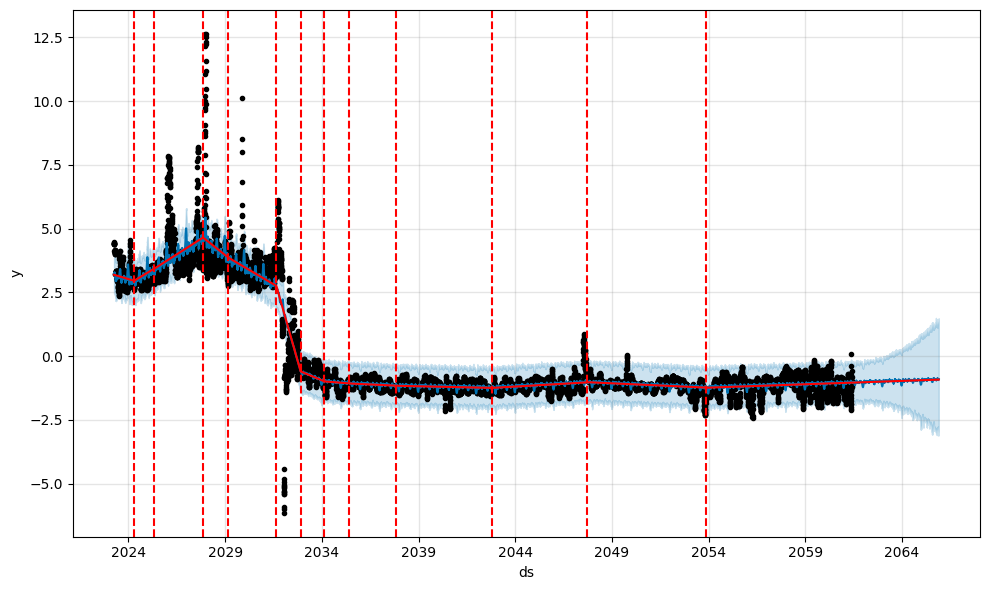

In [17]:
fig = prophet.plot(forecast)
a = add_changepoints_to_plot(fig.gca(), prophet, forecast)

## Segundo Componente

- Calipher (0.40)
- Deep Induction Standard Processed Resistivity (0.48)
- Medium Induction Standard Processed Resistivity (0.48)
- Spontaneous Potential (0.37)

In [ ]:
prophet = Prophet(seasonality_mode='multiplicative', changepoint_prior_scale=0.05)
ts = pd.DataFrame({'ds':df_final.dates_sec,'y':df_final.y})
ts['x'] = df_final['x'].values

prophet.fit(ts)
future = prophet.make_future_dataframe(periods=qty_days)
forecast = prophet.predict(future)
forecast[['ds','yhat','yhat_lower','yhat_upper']].head()

In [ ]:
plot_plotly(prophet, forecast)

In [ ]:
fig = prophet.plot(forecast)
a = add_changepoints_to_plot(fig.gca(), prophet, forecast)

## Map date to depth

In [ ]:
def date_to_depth(df, date):
    return df[df.dates_sec == f'{date} 00:00:00']

In [ ]:
date_to_depth(df, '2030-05-01')

# Prophet con no componente: (Gamma Rays)

In [ ]:
prophet2 = Prophet()
ts2 = pd.DataFrame({'ds':df.dates_sec,'y':df.GR})
ts2['CALI'] = df['CALI'].values
ts2['DRHO'] = df['DRHO'].values
ts2['DT'] = df['DT'].values
ts2['GR'] = df['GR'].values
ts2['ILD'] = df['ILD'].values
ts2['ILM'] = df['ILM'].values
ts2['NPHI'] = df['NPHI'].values
ts2['PEF'] = df['PEF'].values
ts2['RHOB'] = df['RHOB'].values
ts2['SFLA'] = df['SFLA'].values
ts2['SP'] = df['SP'].values

prophet2.fit(ts2)
future = prophet2.make_future_dataframe(periods=1644)
forecast = prophet2.predict(future)
forecast[['ds','yhat','yhat_lower','yhat_upper']].head()

In [ ]:
fig = prophet2.plot(forecast)
a = add_changepoints_to_plot(fig.gca(), prophet2, forecast)

In [ ]:
plot_components_plotly(prophet2, forecast)